# Testing monomeric data

In [2]:
import os
import string
import numpy as np
import pandas as pd
from FlowCytometryTools import ThresholdGate, PolyGate
from matplotlib import pyplot as plt
from matplotlib import cm
from ckine.flow import importF
from ckine.FCimports import combineWells

In [3]:
path_ = os.path.abspath('')
pathname1 = str(path_ + "/ckine/data/flow/CD4 T cells - IL2-060 mono, IL2-060 dimeric")
pathname2 = str(path_ + "/ckine/data/flow/NK CD8 T cells - IL2-060 mono, IL2-060 dimeric")



In [5]:
Tsample1A, _ = importF(pathname1, "A")
Cd8_NKsample1A, _ = importF(pathname2, "A")
TsampleA = combineWells(Tsample1A)
print(TsampleA)
Cd8_NKsampleA = combineWells(Cd8_NKsample1A)
TsampleA = TsampleA.transform("tlog", channels=['VL1-H', 'VL4-H', 'BL1-H','BL3-H'])
Cd8_NKsampleA = Cd8_NKsampleA.transform("tlog", channels=['RL1-H', 'VL4-H', 'BL1-H'])




<FCMeasurement 'Test Sample0'>


## C) T helper and T regulatory cells

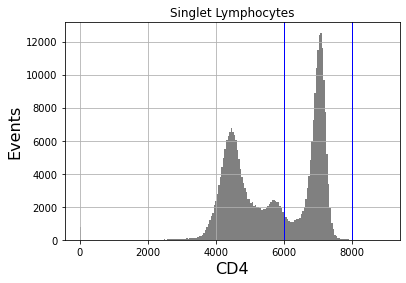

In [10]:
cd4_gate = ThresholdGate(6000.0, ['VL4-H'], region='above') & ThresholdGate(8000.0, ['VL4-H'], region='below')
_ = TsampleA.plot(['VL4-H'], gates=cd4_gate) #CD4
plt.title("Singlet Lymphocytes")
plt.xlabel("CD4")
plt.ylabel("Events")
plt.grid()
#print("Percent gated as CD3+CD4+: ", panel1.gate(cd3cd4_gate).counts/panel1.counts*100., "%")

In [ ]:
sampleCD4 = TsampleA.gate(cd4_gate)
_ = sampleCD4.plot(['BL1-H', 'VL1-h'], gates=None, cmap=cm.jet) #CD4
plt.title("CD4+ Cells")
#plt.xlabel("CD35")
#plt.ylabel("FOXP3")
plt.grid()


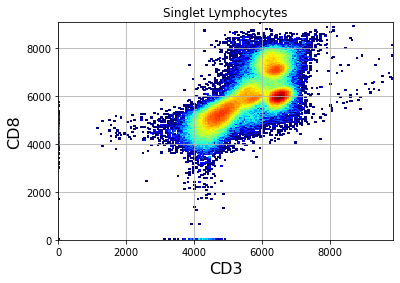

In [8]:
#CD8+ Cells

_ = Cd8_NKsampleA.plot(['VL4-H', 'RL1-H'], gates=None, cmap=cm.jet) #CD3, CD8
plt.title("Singlet Lymphocytes")
plt.xlabel("CD3")
plt.ylabel("CD8")
plt.grid()

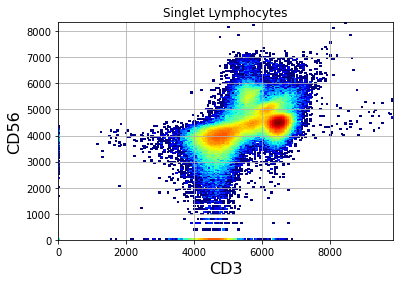

In [9]:
#NK Cells 
_ = Cd8_NKsampleA.plot(['VL4-H', 'BL1-H'], gates=None, cmap=cm.jet) #CD3, CD56
plt.title("Singlet Lymphocytes")
plt.xlabel("CD3")
plt.ylabel("CD56")
plt.grid()